In [1]:
#Utility functions

import matplotlib.image as mpimg
import numpy as np
import cv2
from skimage.feature import hog

def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)


# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    flag = 0
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
            # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            if(flag == 0):
                print('hog_features shape ', hog_features.shape, ' hist_features ', hist_features.shape, ' spatial_features ', spatial_features.shape )
                flag = 1
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

# Function takes an image and the list of windows to be searched (output of slide_windows())
# and returns the search windows with positive detections
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


/Users/hyadava/anaconda3/lib/python3.6/importlib/_bootstrap.py:205: RuntimeWarning: compiletime version 3.4 of module 'mtrand' does not match runtime version 3.6
  return f(*args, **kwds)


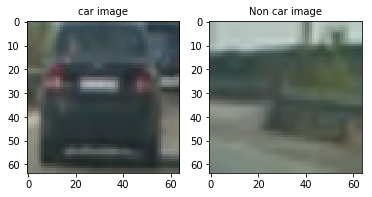

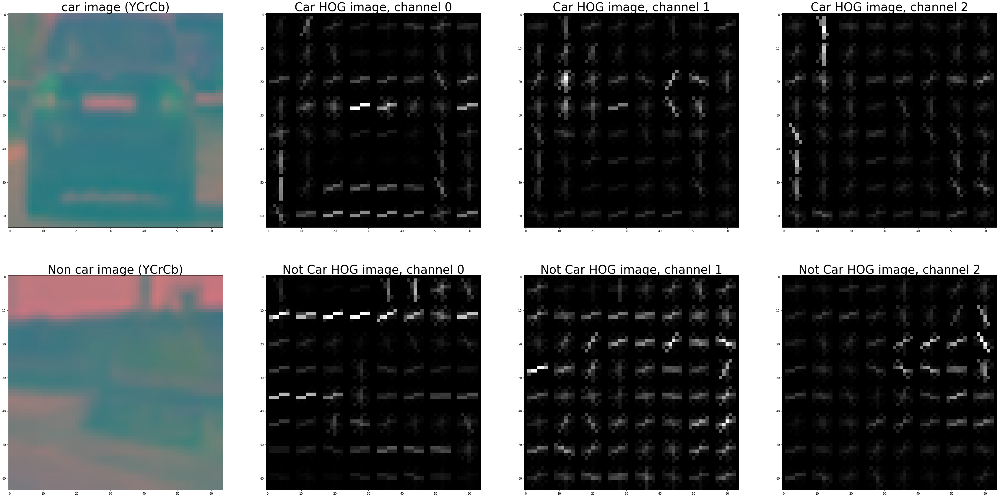

In [2]:
#Exploring HOG features
import matplotlib.pyplot as plt

car_img = mpimg.imread('vehicles/GTI_MiddleClose/image0001.png')
not_car_img = mpimg.imread('non-vehicles/GTI/image10.png')

f = plt.figure()
plt.subplot(121)
plt.imshow(car_img)
plt.title('car image', fontsize=10)

plt.subplot(122)
plt.imshow(not_car_img, cmap='gray')
plt.title('Non car image', fontsize=10)
plt.show()

car_img = cv2.cvtColor(car_img, cv2.COLOR_RGB2YCrCb)
not_car_img = cv2.cvtColor(not_car_img, cv2.COLOR_RGB2YCrCb)

# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2

idx = 241
fig = plt.figure(figsize=(60,30))

plt.subplot(idx)
plt.imshow(car_img, cmap='gray')
plt.title('car image (YCrCb)', fontsize=40)
idx += 1

for channel in range(not_car_img.shape[2]):
    # Call our function with vis=True to see an image output
    car_features, car_hog_image = get_hog_features(car_img[:,:,channel], orient, 
                                               pix_per_cell, cell_per_block, 
                                               vis=True, feature_vec=False)
    plt.subplot(idx)
    plt.imshow(car_hog_image, cmap='gray')
    plt.title('Car HOG image, channel ' + str(channel), fontsize=40)
    idx += 1
    
plt.subplot(idx)
plt.imshow(not_car_img, cmap='gray')
plt.title('Non car image (YCrCb)', fontsize=40)
idx += 1
for channel in range(not_car_img.shape[2]):
    # Call our function with vis=True to see an image output
    not_car_features, not_car_hog_image = get_hog_features(not_car_img[:,:,channel], orient, 
                                          pix_per_cell, cell_per_block,
                                          vis=True, feature_vec= False)
    plt.subplot(idx)
    plt.imshow(not_car_hog_image, cmap='gray')
    plt.title('Not Car HOG image, channel ' + str(channel), fontsize=40)
    idx += 1

plt.show()

In [6]:
#TRAIN THE CAR/NON-CAR IMAGE CLASSIFIER

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog

# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split
    
# Read in cars and notcars
car_images = glob.glob('vehicles/*/*.png')
non_car_images = glob.glob('non-vehicles/*/*.png')

print('car_images ', len(car_images), ' non_cars_images ', len(non_car_images))

cars = []
notcars = []

for image in car_images:
    cars.append(image)

for image in non_car_images:
    notcars.append(image)

print('num cars ', len(cars), ' notcars ', len(notcars))

color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"

#spatial_size = (16, 16) # Spatial binning dimensions
#hist_bins = 16    # Number of histogram bins

#spatial_size = (32, 32) # Spatial binning dimensions
spatial_size = (64, 64) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins


spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [400, None] # Min and max in y to search in slide_window()
car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
print('car_features len ', len(car_features))

notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)


X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

print('scaled_X shape ', scaled_X.shape, ' X shape ', X[0].shape)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

from sklearn.externals import joblib
import pickle as pkl

joblib.dump(svc, 'car_classifier.pkl') 


/Users/hyadava/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


car_images  8792  non_cars_images  8968
num cars  8792  notcars  8968
hog_features shape  (5292,)  hist_features  (96,)  spatial_features  (12288,)
car_features len  8792
hog_features shape  (5292,)  hist_features  (96,)  spatial_features  (12288,)
scaled_X shape  (17760, 17676)  X shape  (17676,)
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 17676
30.65 Seconds to train SVC...
Test Accuracy of SVC =  0.9904


['car_classifier.pkl']

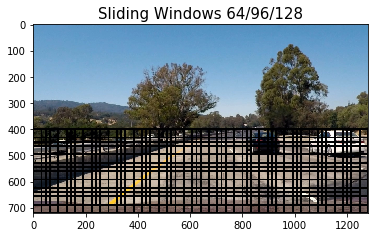

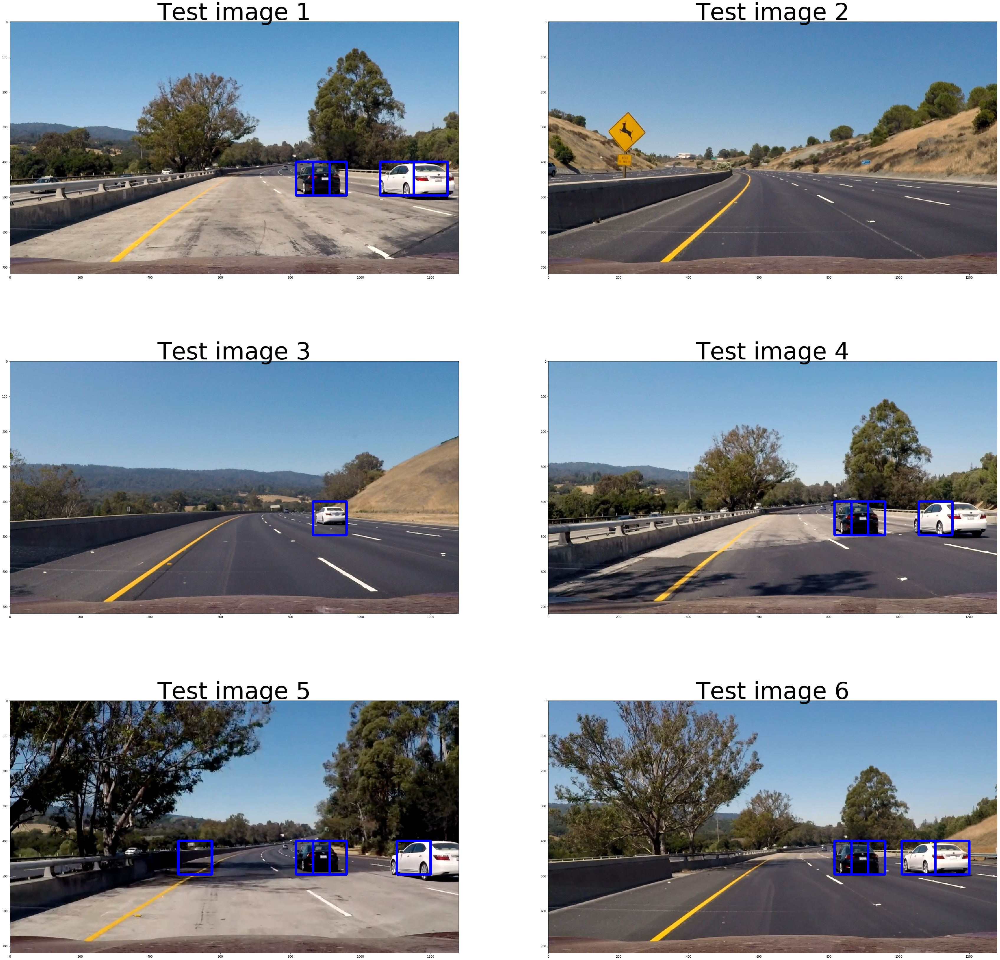

In [7]:

svc = joblib.load('car_classifier.pkl') 

# Check the prediction time for a single sample
t=time.time()

image = mpimg.imread('test_images/test1.jpg')

#plt.imshow(image)

draw_image = np.copy(image)

# Uncomment the following line if you extracted training
# data from .png images (scaled 0 to 1 by mpimg) and the
# image you are searching is a .jpg (scaled 0 to 255)
image = image.astype(np.float32)/255

windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(128, 128), xy_overlap=(0.5, 0.5))
all_windows_img = draw_boxes(np.copy(image), windows, color=(0, 0, 255), thick=6)

windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5))
all_windows_img = draw_boxes(all_windows_img, windows, color=(0, 0, 255), thick=6)

windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(0.5, 0.5))
all_windows_img = draw_boxes(all_windows_img, windows, color=(0, 0, 255), thick=6)


plt.imshow(all_windows_img)
plt.title('Sliding Windows 64/96/128', fontsize=15)
plt.show()

idx = 321
fig = plt.figure(figsize=(60,60))

for i in range(1, 7):
    image = mpimg.imread('test_images/test'+str(i)+'.jpg')
    draw_image = np.copy(image)
    image = image.astype(np.float32)/255

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

    plt.subplot(idx)
    plt.imshow(window_img, cmap='gray')
    plt.title('Test image ' + str(i), fontsize=80)
    idx += 1

plt.show()

In [4]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y

        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

In [5]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2

from scipy.ndimage.measurements import label

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, xtart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    #saved_args = locals()
    #print("saved_args is", saved_args)
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,xstart:xstop,:]
    
    #print('img_tosearch size ', img_tosearch.shape)
    
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    #ctrans_tosearch = convert_color(img_tosearch, conv='RGB2LUV')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    feat_vec = False
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=feat_vec)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=feat_vec)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=feat_vec)
    
    boxes = list()
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            #print('hog_feat1 ', hog_feat1.shape, ' hog_feat2 ', hog_feat2.shape, ' hog_feat3 ', hog_feat3.shape)

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            #print('spatial_features ', spatial_features.shape, ' hist_features ', hist_features.shape, ' hog_features ', hog_features.shape)

            # Scale features and make a prediction
            stacked = np.hstack((spatial_features, hist_features, hog_features)).reshape(1,-1)
            #print('stacked shape ', stacked.shape)
            test_features = X_scaler.transform(stacked)
            #test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            #print('test_pred ', test_prediction)
            xbox_left = np.int(xleft*scale)
            #if test_prediction == 1 and xpos > 250:
            if test_prediction == 1:
            
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                
                x1 = xbox_left+xstart
                y1 = ytop_draw+ystart
                x2 = xbox_left+xstart+win_draw
                y2 = ytop_draw+win_draw+ystart
                
                #print('x1 ', x1, ' xstart*scale ', (xstart*scale), ' x2 ', x2)
                
                if(x1 > xstart*scale):
                    cv2.rectangle(draw_img, (x1, y1), (x2, y2), (0,0,255),6)
                    boxes.append(((x1,y1), (x2,y2)))

                #cv2.rectangle(draw_img,(xbox_left+xstart, ytop_draw+ystart),(xbox_left+xstart+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                #boxes.append(((xbox_left+xstart, ytop_draw+ystart),(xbox_left+xstart+win_draw,ytop_draw+win_draw+ystart)))

                
                #cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                #boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
    return draw_img, boxes, img_tosearch
    
#img = mpimg.imread('test_images/test2.jpg')

#img = img.astype(np.float32)/255



idx  331
idx  332
idx  334
idx  335
idx  337
idx  338


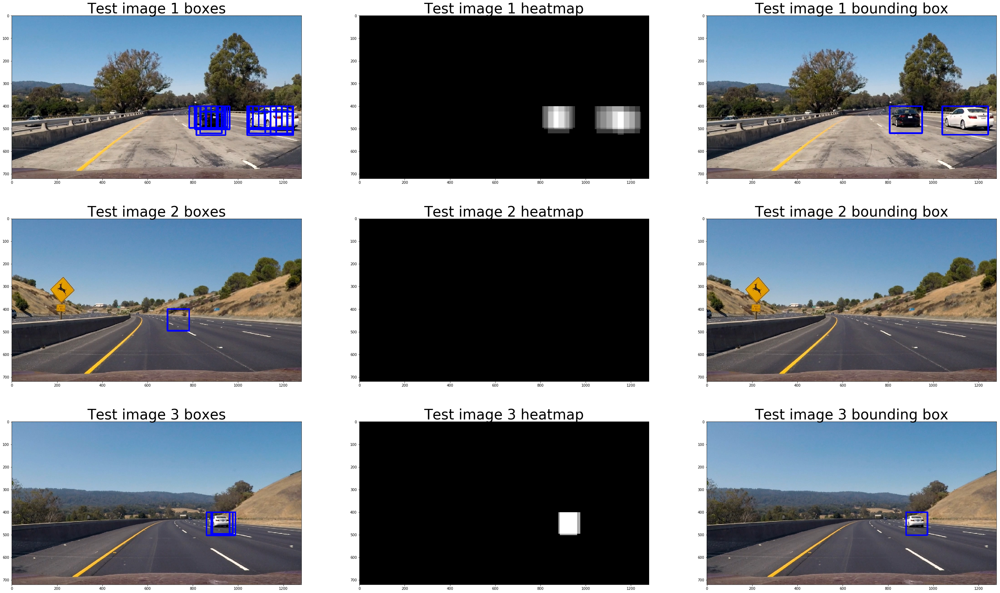

"\nf, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(120,60))\n#f, (ax1, ax2) = plt.subplots(2, 1, figsize=(40,20))\n\nax1.imshow(out_img1)\nax1.set_title('All boxes', fontsize=10)\n\nax2.imshow(heatmap1)\nax2.set_title('Heat Map', fontsize=10)\n\nax3.imshow(out_img3)\nax3.set_title('All boxes', fontsize=10)\n\nax4.imshow(draw_img)\nax4.set_title('bounding boxes', fontsize=10)\n\nax5.imshow(heatmap)\nax5.set_title('Heat Map', fontsize=10)\n\nplt.show()\n"

In [74]:
ystart = 400
ystop = 656
xstart = 400
xstop = 1280

def find_cars_in_img(image_file, scale):
    img = mpimg.imread(image_file)

    heat = np.zeros_like(img[:,:,0]).astype(np.float)

    out_img, boxes, s_img = find_cars(img, ystart, ystop, xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    # Add heat to each box in box list
    heat = add_heat(heat,boxes)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    #draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return out_img, heatmap, boxes

scale1 = 1.6
scale2 = 1.5
scale3 = 2.0

idx = 331
fig = plt.figure(figsize=(50,30))

for i in range(1, 4):
    img_file = 'test_images/test'+str(i)+'.jpg'
    draw_image = np.copy(image)

    img = np.copy(mpimg.imread(img_file))
    #img = img.astype(np.float32)/255
    
    out_img1, heatmap1, boxes1 = find_cars_in_img(img_file, scale1)
    out_img2, heatmap2, boxes2 = find_cars_in_img(img_file, scale2)
    out_img3, heatmap3, boxes3 = find_cars_in_img(img_file, scale3)


    boxes = boxes1+boxes2+boxes3
    window_img = draw_boxes(np.copy(img), boxes, color=(0, 0, 255), thick=6)                    

    heat = np.zeros_like(img[:,:,0]).astype(np.float)

    # Add heat to each box in box list
    heat = add_heat(heat,boxes)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    print('idx ', idx)

    plt.subplot(idx)
    plt.imshow(window_img, cmap='gray')
    plt.title('Test image ' + str(i) + ' boxes', fontsize=40)
    idx += 1

    plt.subplot(idx)
    plt.imshow(heatmap, cmap='gray')
    plt.title('Test image ' + str(i) + ' heatmap', fontsize=40)
    idx += 1

    plt.subplot(idx)
    plt.imshow(draw_img, cmap='gray')
    plt.title('Test image ' + str(i) + ' bounding box', fontsize=40)
    idx += 1

plt.show()


In [7]:
def vehicle_detection_pipeline(img):
    ystart = 400
    ystop = 656
    xstart1 = 400
    xstop1 = 1280
    scale = 1.7
    
    heat = np.zeros_like(img[:,:,0]).astype(np.float)

    out_img, boxes1, s_img = find_cars(img, ystart, ystop, xstart1, xstop1, 1.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    out_img, boxes2, s_img = find_cars(img, ystart, ystop, xstart1, xstop1, 1.4, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    out_img, boxes3, s_img = find_cars(img, ystart, ystop, xstart1, xstop1, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    boxes = boxes1+boxes2+boxes3
    #boxes = boxes1+boxes3
        
    # Add heat to each box in box list
    heat = add_heat(heat,boxes)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img


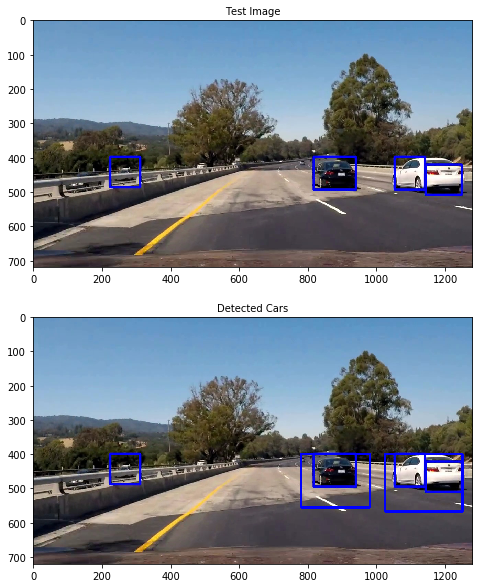

In [8]:
#img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('frame_161.jpg')
img = mpimg.imread('frame_33.jpg')

img_with_detection = vehicle_detection_pipeline(img)

f, (ax1, ax2) = plt.subplots(2, 1, figsize=(20,10))

ax1.imshow(img)
ax1.set_title('Test Image', fontsize=10)

ax2.imshow(img_with_detection)
ax2.set_title('Detected Cars', fontsize=10)

plt.show()


In [9]:
# Apply the pipeline to the project video
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_vid_output = 'project_vid_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
#clip1 = VideoFileClip("test_video.mp4")

project_vid_clip = clip1.fl_image(vehicle_detection_pipeline)

%time project_vid_clip.write_videofile(project_vid_output, audio=False)

[MoviePy] >>>> Building video project_vid_output.mp4
[MoviePy] Writing video project_vid_output.mp4


100%|█████████▉| 1260/1261 [28:31<00:01,  1.32s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_vid_output.mp4 

CPU times: user 1h 41min 2s, sys: 3min 55s, total: 1h 44min 57s
Wall time: 28min 32s


In [12]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_vid_output))

In [11]:
import cv2

cap = cv2.VideoCapture('project_vid_output.mp4') #video_name is the video being called
frame_no = 33
cap.set(1,frame_no); # Where frame_no is the frame you want
ret, frame = cap.read() # Read the frame
cv2.imshow('window_name', frame) # show frame on window
cv2.waitKey(500)
cv2.imwrite('frame_'+str(frame_no)+'.jpg', frame)

True